# Importing Library and Data

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
pd.set_option('display.max_columns', None)

df1 = pd.read_csv('./data/raw/products.tsv', delimiter = '\t')
df2 = pd.read_csv('./data/raw/reviews.tsv', delimiter = '\t')
display(df1.head(2))
display(df2.head(2))

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
0,103205,"Hwipure, Disposable KF94 ( N95 / KN95/ FFP2 ) ...",2.95,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Hwipure-Disposable-KF9...,https://au.iherb.com/c/protective-face-masks
1,101774,"HIGUARD, Disposable KF94 ( N95 / KN95/ FFP2 ) ...",2.95,AUD,http://schema.org/InStock,https://au.iherb.com/pr/HIGUARD-Disposable-KF9...,https://au.iherb.com/c/protective-face-masks


,abuseCount,customerNickname,helpfulNo,helpfulYes,id,imagesCount,languageCode,postedDate,productId,profileInfo.ugcSummary.answerCount,profileInfo.ugcSummary.reviewCount,ratingValue,reviewText,reviewTitle,reviewed,score,languageCode.1,translation.reviewText,translation.reviewTitle
0,0,iHerb Customer,0,6,05c2b17e-c28d-4792-930d-27e787d8d4ad,1,en-US,2021-01-27T09:04:10.569Z,103839,0.0,34.0,50,The mask quality and the color is good. It fit...,Dotted Pattern Is Nice,True,1.614071e+09,en-US,NaN,NaN
1,0,iHerb Customer,0,0,80e44af8-2edf-4b81-a80a-7e7888d03cc0,0,ru-RU,2021-02-07T00:56:39.055Z,103839,0.0,37.0,50,Внуку очень понравилось. Удобная маска.,Прекрасно!,False,1.612659e+09,ru-RU,The grandson really liked it. Comfortable mask.,en-US


In [10]:
df2.customerNickname.value_counts()

iHerb Customer      3382
Alexooo                7
Vergissmeinnicht       7
iherb2reviews          6
Ancaria                5
                    ... 
LeroyBrown             1
AlekseyMoscow          1
Um-saif12              1
Svetlasha              1
Miffyrules             1
Name: customerNickname, Length: 351, dtype: int64

In [11]:
# merging the df1 and df2
df2 = df2.merge(df1, how = 'left', left_on = 'productId', right_on = 'product_id') 

# getting the english comment
df2.loc[:, 'review_body'] = ""
df2.loc[df2['languageCode'] == 'en-US', 'review_body'] = df2.loc[df2['languageCode'] == 'en-US', 'reviewText']
df2.loc[df2['languageCode'] != 'en-US', 'review_body'] = df2.loc[df2['languageCode'] != 'en-US', 'translation.reviewText']

# vader sentiment features
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from tqdm import tqdm
tqdm.pandas()
nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()
df2.loc[:, 'vader_sentiment'] = df2.review_body.progress_apply(lambda x: sid.polarity_scores(x)['compound'])


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\tommy\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
100%|██████████| 3849/3849 [00:00<00:00, 4710.94it/s]


In [12]:
# checking the vader sentiment and the values
for i in range(5):
    print(df2.loc[i, 'review_body'])
    print(df2.loc[i, 'vader_sentiment'])
    print('\n')

# checking the negative vader sentiment 
print('NEGATIVE SENTIMENT')
for i in range(5):
    print(df2.loc[df2.vader_sentiment < 0, 'review_body'].iloc[i])
    print(df2.loc[df2.vader_sentiment < 0, 'vader_sentiment'].iloc[i])
    print('\n')

The mask quality and the color is good. It fits to my face fine. 
0.5719


The grandson really liked it. Comfortable mask.
0.7688


Easy to put on & comfortable to wear.
0.7351


A thin mask that is pleasant to the body. I liked the colors too
0.7269


Great mask! It suited me perfectly. There is a slight smell. It looks decent. The quality is excellent.
0.923


NEGATIVE SENTIMENT
Very pleasant on the face, I started using clay and the second mask was scratching the wounds. There is no problem with this here.
-0.079


The reason why i gave 3 stars is the masks looks soft, it wasn't and some were smaller than others. Not comfortable 
-0.4023


Hard to breathe and does not hold up on the face. Falls all the time.
-0.1027


This mask is small and does not fit the face tightly. In general, she breathes normally. Made of cotton, wash well.
-0.0026


A good mask for those who are forced to wear, but do not really want to do it)). Because it is small and a lot of air passes).
-0.1799




In [19]:
# creating dataframe for descriptive analysis 
import datetime

columns = ['abuseCount', 'customerNickname', 'id', 'helpfulNo', 'helpfulYes', 'imagesCount', 'languageCode', 'postedDate', 'productId',
           'profileInfo.ugcSummary.answerCount', 'profileInfo.ugcSummary.reviewCount', 'ratingValue', 'reviewTitle', 'reviewed', 
           'score', 'translation.reviewText', 'translation.reviewTitle', 'product_name', 'product_price', 'review_body',
           'vader_sentiment']
           
df_analysis = df2[columns].copy()
df_analysis.postedDate = pd.to_datetime(df_analysis.postedDate)
df_analysis.sort_values(by = 'postedDate', inplace = True)
df_analysis.productId = df_analysis.productId.astype('str')

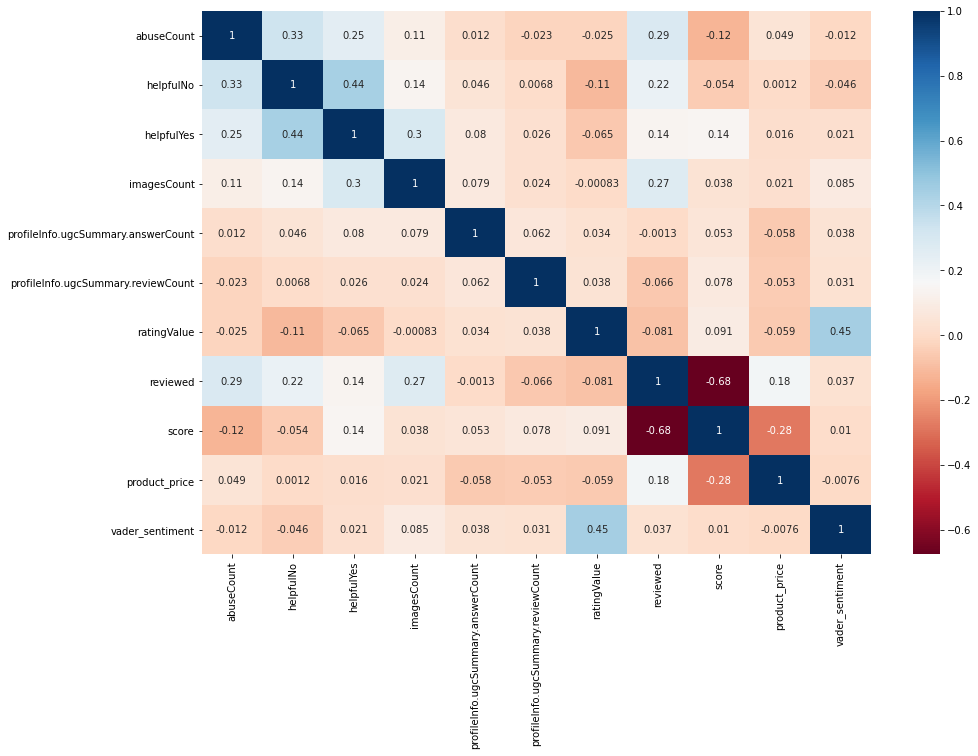

In [20]:
# heatmap to check vader sentiment
plt.figure(figsize = [15,10])
sns.heatmap(df_analysis.corr(), annot= True, cmap = 'RdBu')

plt.show()

In [21]:
from scipy.stats import linregress

# checking the growth 
slope = []
products = df_analysis.productId.unique()
for product in products:
    y = df_analysis.loc[df_analysis.productId == product, ['postedDate', 'review_body']].set_index('postedDate').resample('W').count().review_body.values
    x = range(len(y))
    slope.append(linregress(x,y).slope)

pd.DataFrame({'products' : products, 'slope' : slope }).sort_values('slope', ascending=False)

C:\Users\tommy\anaconda3\lib\site-packages\scipy\stats\_stats_mstats_common.py:160: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
C:\Users\tommy\anaconda3\lib\site-packages\scipy\stats\_stats_mstats_common.py:174: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
C:\Users\tommy\anaconda3\lib\site-packages\scipy\stats\_stats_mstats_common.py:176: RuntimeWarning: invalid value encountered in double_scalars
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


,products,slope
18,103205,7.285714
20,103838,5.000000
11,101955,3.193676
24,103839,3.000000
21,103840,2.800000
16,102734,2.512088
19,103743,1.900000
23,103842,1.500000
22,103841,1.100000
17,103204,0.866667


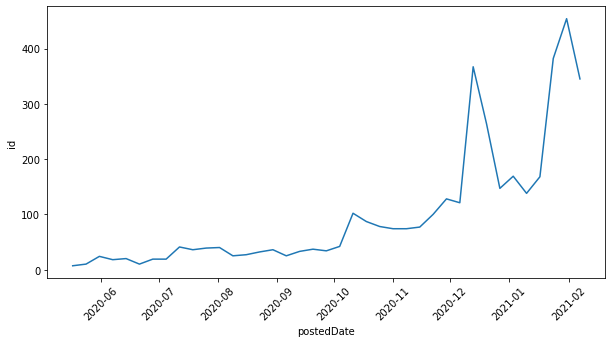

In [22]:
# line plot of the review over time (weekly)
df_week = df_analysis[['id', 'postedDate']].set_index('postedDate').resample('W').count()
plt.figure(figsize = [10,5])
sns.lineplot(data=df_week, x=df_week.index, y='id')
plt.xticks(rotation = 45)
plt.show()

good reviews 195
bad reviews 20


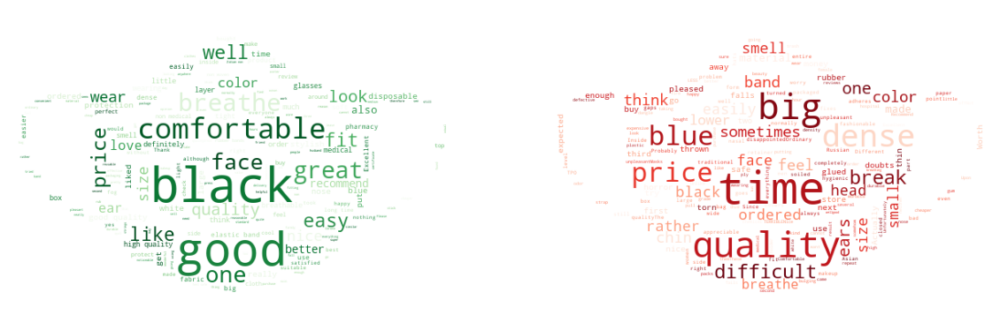

In [30]:
# populating good review for a specific product

product_id = '102734'

import nltk
from nltk.corpus import stopwords
from PIL import Image
from wordcloud import WordCloud

stopwords_list = stopwords.words('english')
stopwords_list += ['mask', 'masks']

filter1 = df_analysis.productId == product_id
filter2 = df_analysis.vader_sentiment >= 0.5
text = df_analysis.loc[filter1 & filter2, 'review_body']
print('good reviews', len(text))
good_review = ""
for i in text:
    good_review += i

filter1 = df_analysis.productId == product_id
filter2 = df_analysis.vader_sentiment <= -0.2
text = df_analysis.loc[filter1 & filter2, 'review_body']
print('bad reviews', len(text))
review = ""
for i, sentence in enumerate(text):
    # print(i, sentence)
    review += sentence

char_mask = np.array(Image.open("./Data/mask.jpg"))

wordcloud_good = WordCloud(background_color = 'white', 
                    colormap = 'Greens',
                    collocations = True,
                    mask = char_mask,
                    stopwords = stopwords_list).generate(good_review)

wordcloud_bad = WordCloud(background_color = 'white', 
                    colormap = 'Reds',
                    collocations = True,
                    mask = char_mask,
                    stopwords = stopwords_list).generate(review)


plt.figure(figsize = (20,10))
plt.subplot(1,2,1)
plt.imshow(wordcloud_good.recolor(random_state=2019))
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(wordcloud_bad.recolor(random_state=2019))
plt.axis('off')
plt.show()

25


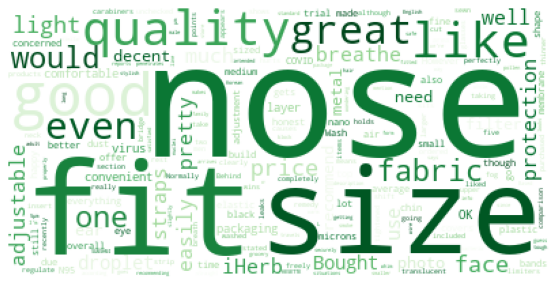

54


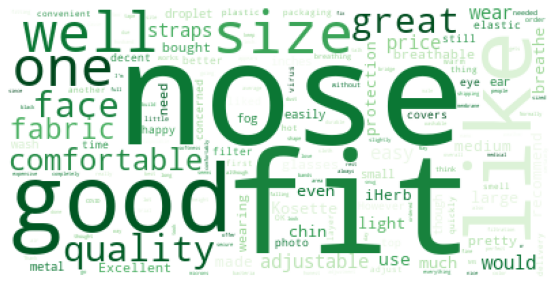

136


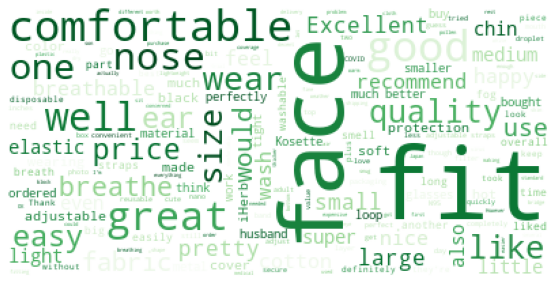

218


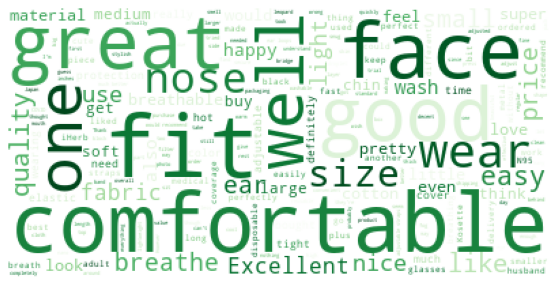

300


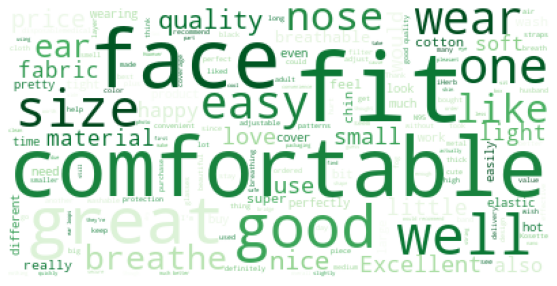

536


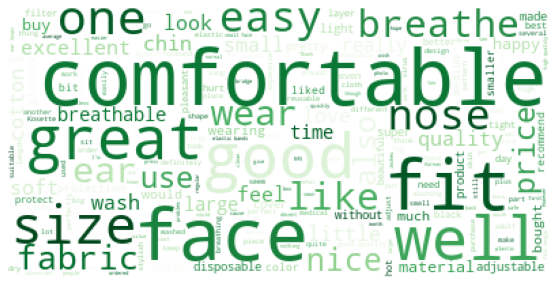

788


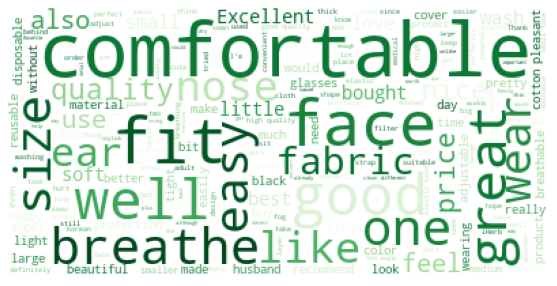

1387


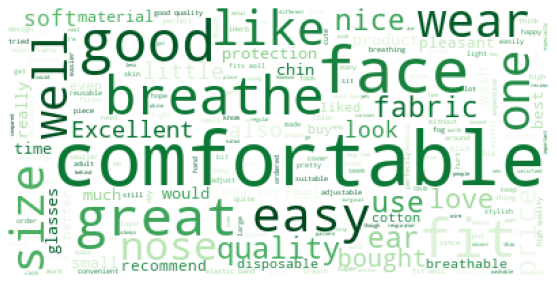

In [31]:
from datetime import datetime, date
from dateutil.relativedelta import *

for m in range(8):
    filter1 = df_analysis.postedDate.dt.date <= date(2020,6,1) + relativedelta(months=+m)
    filter2 = df_analysis.vader_sentiment >= 0.5
    text = df_analysis.loc[filter1 & filter2, 'review_body']
    print(len(text))

    review = ""
    for i in text:
        review += i
        
    wordcloud1 = WordCloud(background_color = 'white', 
                        colormap = 'Greens',
                        collocations = True,
                        stopwords = stopwords_list).generate(review)

    plt.figure(figsize = (10,5))
    plt.imshow(wordcloud1.recolor(random_state=2019))
    plt.axis('off')
    plt.show()

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
17,99830,"Kosette, Nano Reusable Face Protection Mask, M...",22.44,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Kosette-Nano-Reusable-...,https://au.iherb.com/c/protective-face-masks


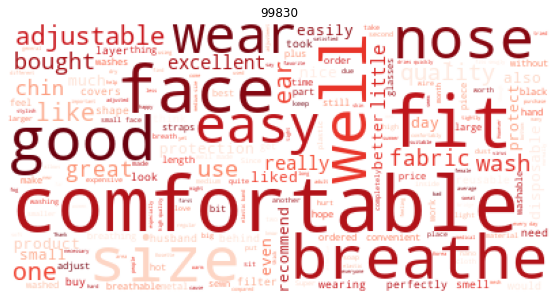

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
19,99829,"Kosette, Nano Reusable Face Protection Mask, L...",22.44,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Kosette-Nano-Reusable-...,https://au.iherb.com/c/protective-face-masks


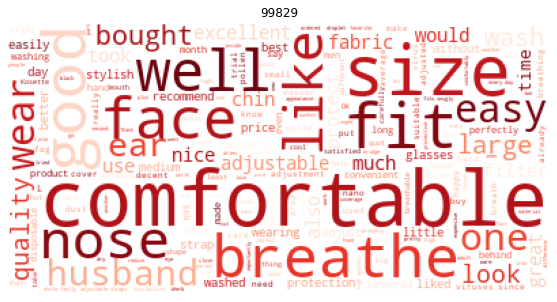

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
24,100099,"Luseta Beauty, Disposable Protection Face Mask...",49.61,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Luseta-Beauty-Disposab...,https://au.iherb.com/c/protective-face-masks


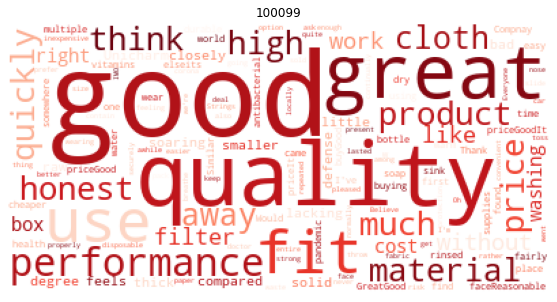

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
25,100234,"Luseta Beauty, Disposable Protection Face Mask...",44.31,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Luseta-Beauty-Disposab...,https://au.iherb.com/c/protective-face-masks


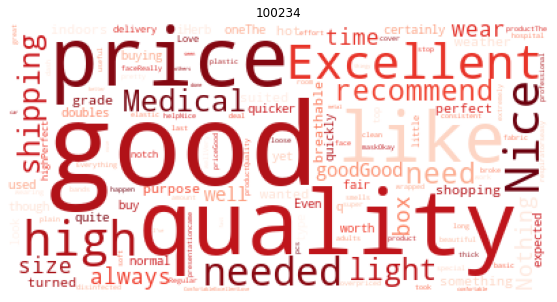

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
15,100237,"Kitsch, 100% Cotton Reuseable Face Masks, Leop...",17.72,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Kitsch-100-Cotton-Reus...,https://au.iherb.com/c/protective-face-masks


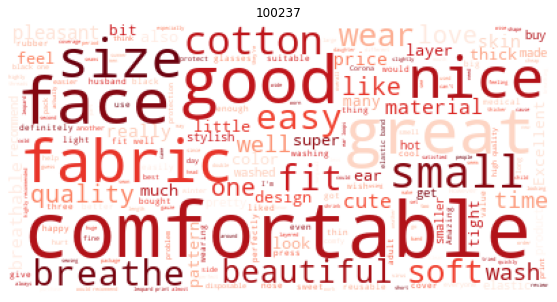

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
23,100541,"Tony Moly, CTT KN95 Respirator Mask, 5 Count",26.57,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Tony-Moly-CTT-KN95-Res...,https://au.iherb.com/c/protective-face-masks


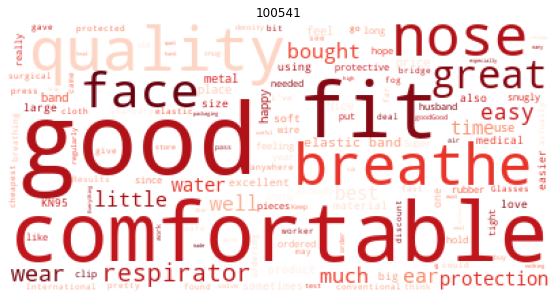

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
5,100837,"La Hauteur, Disposable KF94 ( N95 / KN95/ FFP2...",5.61,AUD,http://schema.org/InStock,https://au.iherb.com/pr/La-Hauteur-Disposable-...,https://au.iherb.com/c/protective-face-masks


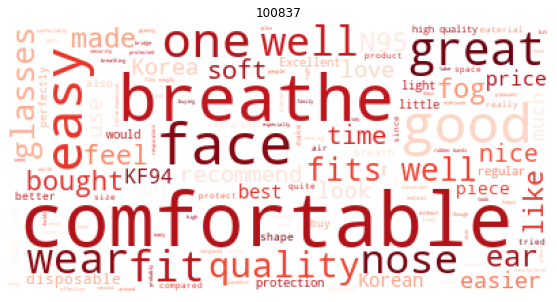

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
26,101029,"Landsberg, 3 Ply Disposable Protective Face Ma...",36.54,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Landsberg-3-Ply-Dispos...,https://au.iherb.com/c/protective-face-masks


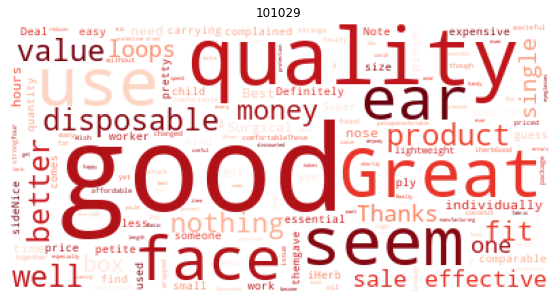

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
14,100839,"One Fine Day, Disposable KF94 ( N95 / KN95/ FF...",4.49,AUD,http://schema.org/InStock,https://au.iherb.com/pr/One-Fine-Day-Disposabl...,https://au.iherb.com/c/protective-face-masks


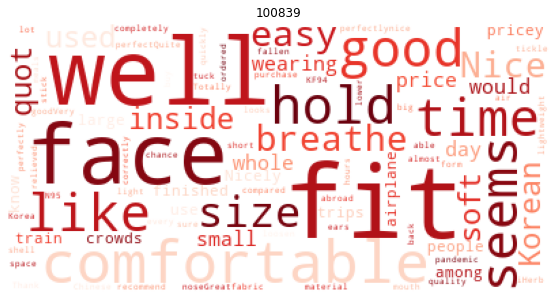

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
6,100840,"YJ Corporation, Disposable KF94 ( N95 / KN95/ ...",3.93,AUD,http://schema.org/InStock,https://au.iherb.com/pr/YJ-Corporation-Disposa...,https://au.iherb.com/c/protective-face-masks


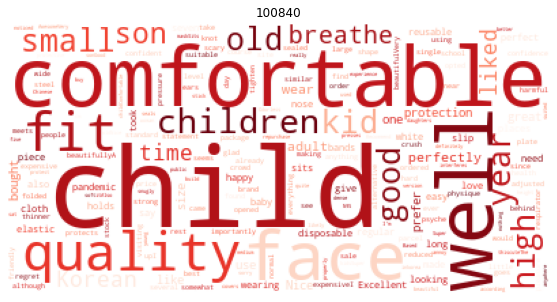

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
22,101691,"Kitsch, 100% Cotton Reuseable Face Masks, Blus...",17.72,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Kitsch-100-Cotton-Reus...,https://au.iherb.com/c/protective-face-masks


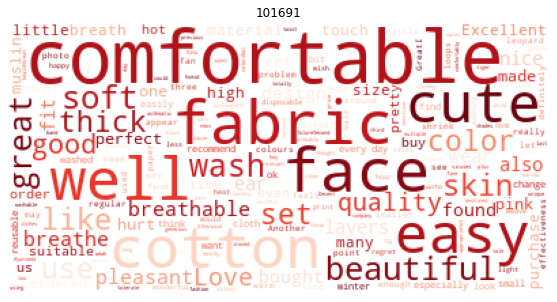

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
2,101955,"SunJoy, KN95, Professional Protective Disposab...",8.86,AUD,http://schema.org/InStock,https://au.iherb.com/pr/SunJoy-KN95-Profession...,https://au.iherb.com/c/protective-face-masks


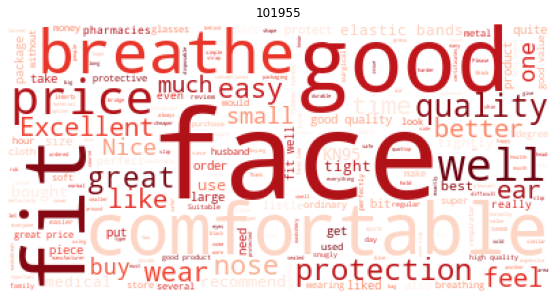

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
13,101692,"Kitsch, 100% Cotton Reusable Face Masks, Neutr...",17.72,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Kitsch-100-Cotton-Reus...,https://au.iherb.com/c/protective-face-masks


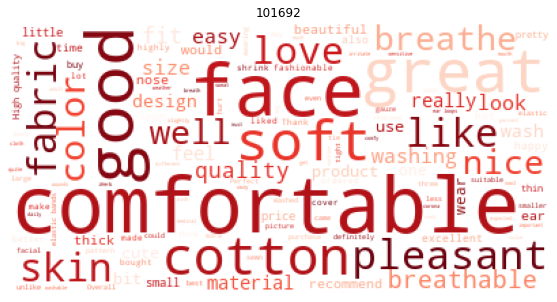

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
1,101774,"HIGUARD, Disposable KF94 ( N95 / KN95/ FFP2 ) ...",2.95,AUD,http://schema.org/InStock,https://au.iherb.com/pr/HIGUARD-Disposable-KF9...,https://au.iherb.com/c/protective-face-masks


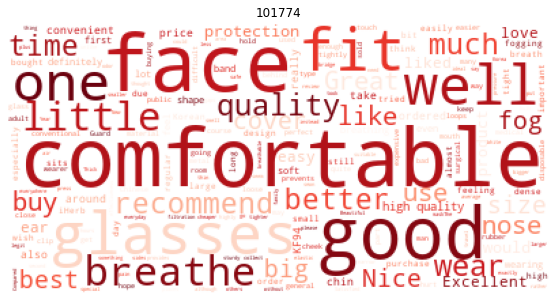

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
21,102455,"Now Foods, Face Mask, Grey, S-M, 1 Mask",2.95,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Now-Foods-Face-Mask-Gr...,https://au.iherb.com/c/protective-face-masks


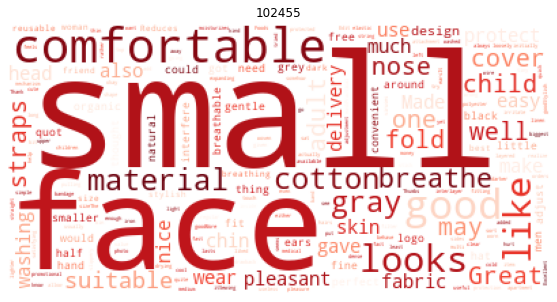

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
10,102522,"Dr. Puri, Disposable KF94 ( N95 / KN95/ FFP2 )...",47.24,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Dr-Puri-Disposable-KF9...,https://au.iherb.com/c/protective-face-masks


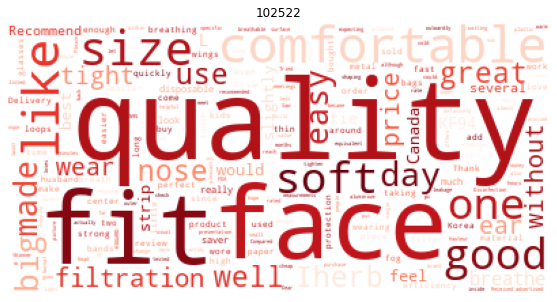

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
4,102734,"Zidian, Disposable Protective Mask, 50 Pack",15.35,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Zidian-Disposable-Prot...,https://au.iherb.com/c/protective-face-masks


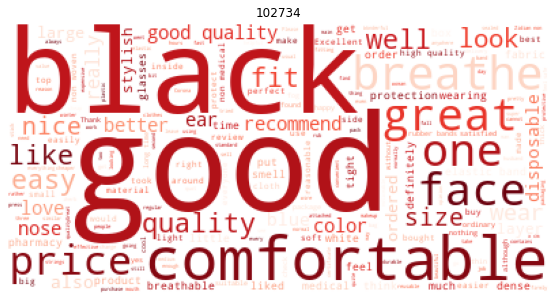

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
7,103204,"Hwipure, Disposable KF94 ( N95 / KN95/ FFP2 ) ...",50.19,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Hwipure-Disposable-KF9...,https://au.iherb.com/c/protective-face-masks


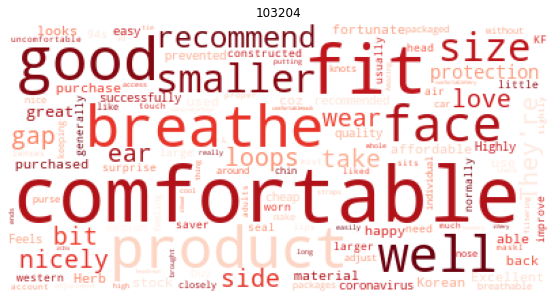

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
0,103205,"Hwipure, Disposable KF94 ( N95 / KN95/ FFP2 ) ...",2.95,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Hwipure-Disposable-KF9...,https://au.iherb.com/c/protective-face-masks


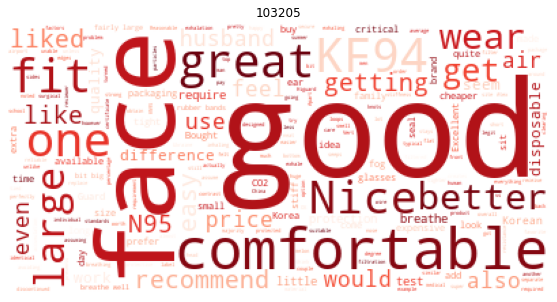

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
9,103743,"Puritas, 10 Days Mask, Large, 3 Pack",6.61,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Puritas-10-Days-Mask-L...,https://au.iherb.com/c/protective-face-masks


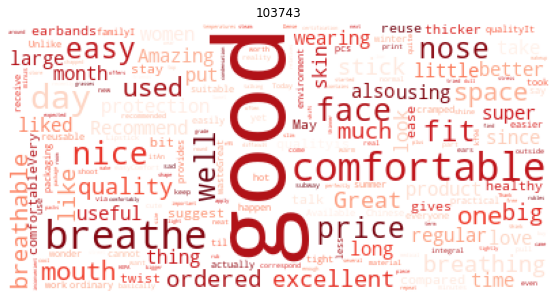

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
3,103838,"Lozperi, Copper Mask, Adult, Black, 1 Mask",6.85,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Lozperi-Copper-Mask-Ad...,https://au.iherb.com/c/protective-face-masks


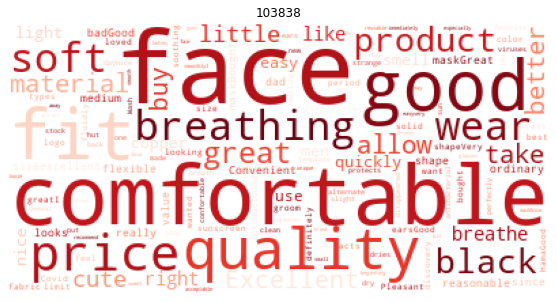

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
8,103840,"Lozperi, Copper Mask, Adult, Gray, 1 Mask",6.85,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Lozperi-Copper-Mask-Ad...,https://au.iherb.com/c/protective-face-masks


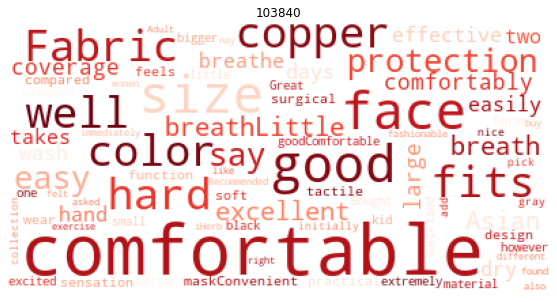

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
16,103841,"Lozperi, Copper Mask, Kids, Black, 1 Mask",6.85,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Lozperi-Copper-Mask-Ki...,https://au.iherb.com/c/protective-face-masks


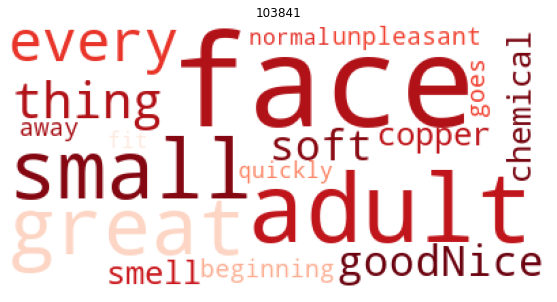

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
20,103842,"Lozperi, Copper Mask, Kids, Gray, 1 Count",6.85,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Lozperi-Copper-Mask-Ki...,https://au.iherb.com/c/protective-face-masks


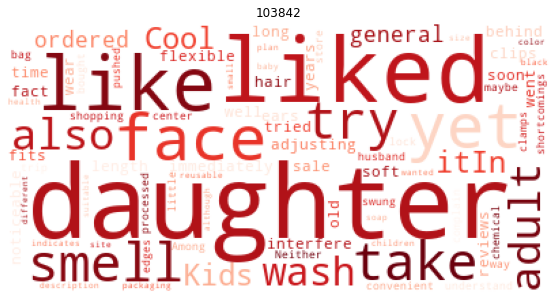

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
11,103839,"Lozperi, Copper Mask, Adult, Dot, 1 Count",6.85,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Lozperi-Copper-Mask-Ad...,https://au.iherb.com/c/protective-face-masks


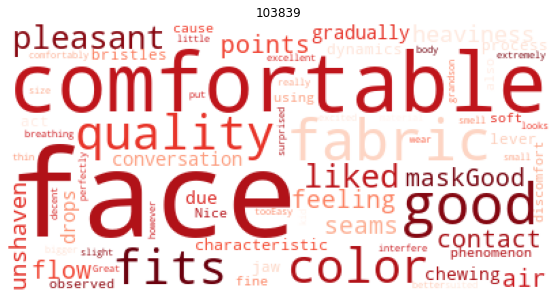

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
18,104022,"Kosette, Fashion Mask with Filter Pocket, 3 M...",11.81,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Kosette-Fashion-Mask-w...,https://au.iherb.com/c/protective-face-masks


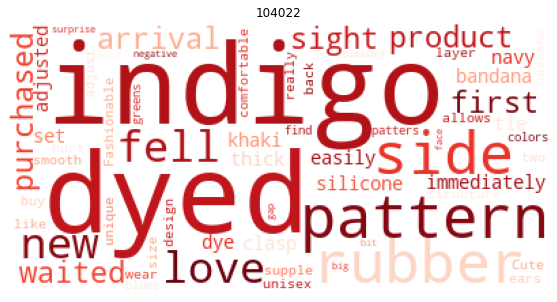

,product_id,product_name,product_price,price_currency,product_availability,product_url,source_url
12,104023,"Kosette, PM 2.5 Replaceable Filter, 24 Filters",5.91,AUD,http://schema.org/InStock,https://au.iherb.com/pr/Kosette-PM-2-5-Replace...,https://au.iherb.com/c/protective-face-masks


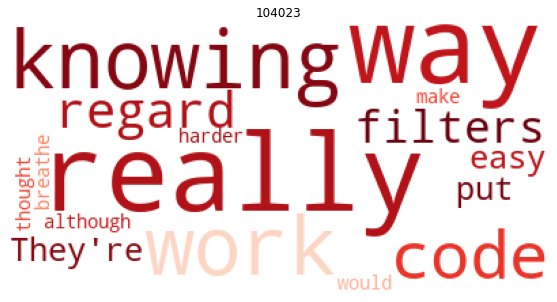

In [26]:
# wordcloud for different products
from PIL import Image
from wordcloud import WordCloud
import matplotlib.pyplot as plt

for product in products:
    filter1 = df_analysis.productId == product
    filter2 = df_analysis.vader_sentiment >= 0.4
    text = df_analysis.loc[filter1 & filter2, 'review_body']
    review = ""
    for i in text:
        review += i

    if len(review) != 0:
        wordcloud1 = WordCloud(background_color = 'white', 
                            colormap = 'Reds',
                            collocations = True, stopwords = stopwords_list).generate(review)

    display(df1[df1.product_id == int(product)])
    plt.figure(figsize = (10,5))
    plt.title(product)
    plt.imshow(wordcloud1.recolor(random_state=2019))
    plt.axis('off')
    plt.show()

In [104]:
# LDA preprocess
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
nltk.download('wordnet')
nltk.download('punkt')
import re

def pre_process(text):
    
    #remove url
    text = re.sub(r"http\S+", "", text)

    #remove special cahracters
    text = re.sub('\W', ' ', text)

    #remove digits
    text = re.sub(r'\d+', '', text)

    #remove _
    text = text.replace('_',' ')

    #remove white spaces
    text = re.sub(r"\s+"," ", text)

    #to lower
    text = text.lower()

    #remove stopwords
    text =' '.join([word for word in text.split() if word not in (stop_words)])

    #lemmitize
    lemmatizer = WordNetLemmatizer()
    text = " ".join([lemmatizer.lemmatize(word) for word in text.split()])
    
    return text

from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
def lemmatize_words(text):
    return " ".join([lemmatizer.lemmatize(word) for word in text.split()])



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tommy\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\tommy\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\tommy\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [179]:
from gensim.test.utils import common_corpus, common_dictionary
import gensim
import nltk 

#tokenize each post
filter1 = df_analysis.productId.isin(['101955', '102734', '99830', '103205', '103838'])
df_analysis.loc[:, 'preprocessed'] = df_analysis['review_body'].progress_apply(pre_process)
processed_docs_train = df_analysis['preprocessed'].progress_apply(lambda text: nltk.word_tokenize(text))

#Find the dictionary
dictionary = gensim.corpora.Dictionary(processed_docs_train)

#Create the Bag-of-words model for train document
bow_corpus_train = [dictionary.doc2bow(doc) for doc in processed_docs_train]

100%|██████████| 3849/3849 [00:00<00:00, 11660.55it/s]


In [192]:
num_topics = 5
lda_model =  gensim.models.LdaMulticore(bow_corpus_train, 
                                   num_topics = num_topics, 
                                   id2word = dictionary,                                    
                                   passes = 10)

for idx, topic in lda_model.print_topics(-1):
    print("Topic: {} \nWords: {}".format(idx, topic ))
    print("\n")

C:\Users\tommy\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Topic: 0 
Words: 0.043*"mask" + 0.020*"excellent" + 0.019*"like" + 0.015*"quality" + 0.014*"size" + 0.011*"best" + 0.010*"one" + 0.009*"comfortable" + 0.009*"bought" + 0.009*"really"


Topic: 1 
Words: 0.079*"good" + 0.041*"mask" + 0.036*"great" + 0.034*"quality" + 0.020*"fit" + 0.019*"price" + 0.019*"well" + 0.013*"comfortable" + 0.013*"breathe" + 0.012*"product"


Topic: 2 
Words: 0.036*"mask" + 0.015*"fabric" + 0.014*"cute" + 0.014*"face" + 0.011*"like" + 0.011*"breathable" + 0.010*"comfortable" + 0.009*"smell" + 0.008*"nose" + 0.008*"little"


Topic: 3 
Words: 0.082*"mask" + 0.028*"comfortable" + 0.016*"breathe" + 0.016*"face" + 0.014*"wear" + 0.012*"well" + 0.012*"good" + 0.011*"one" + 0.011*"easy" + 0.010*"time"


Topic: 4 
Words: 0.063*"mask" + 0.044*"face" + 0.036*"fit" + 0.023*"nice" + 0.022*"small" + 0.021*"size" + 0.016*"good" + 0.014*"comfortable" + 0.013*"well" + 0.010*"quality"




In [193]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

pyLDAvis.enable_notebook()
p = gensimvis.prepare(lda_model, bow_corpus_train, dictionary)
p


C:\Users\tommy\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.016791 -0.035703       1        1  45.007494
4     -0.053616  0.074740       2        1  15.141716
1     -0.092141 -0.005785       3        1  14.536610
0      0.046787 -0.097487       4        1  14.415134
2      0.115762  0.064234       5        1  10.899046, topic_info=        Term        Freq       Total Category  logprob  loglift
19      good  807.000000  807.000000  Default  30.0000  30.0000
298    great  369.000000  369.000000  Default  29.0000  29.0000
20   quality  454.000000  454.000000  Default  28.0000  28.0000
105     face  692.000000  692.000000  Default  27.0000  27.0000
78       fit  545.000000  545.000000  Default  26.0000  26.0000
..       ...         ...         ...      ...      ...      ...
19      good   20.547974  807.168568   Topic5  -5.3397  -1.4543
140   really   17.151635  136.463812   Topic5  -5.5204   0.1425
24     price   17.894997  264.714794   Topic5  -5.4780  -0.4776
118      buy   16.957655  126.818530   Topic5  -5.5318   0.2045
78       fit   17.927475  545.750219   Topic5  -5.4762  -1.1993

[412 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
3585      2  0.741701      access
2801      4  0.833856     account
1007      3  0.853653      across
1884      3  0.853756      action
151       1  0.431665  adjustable
...     ...       ...         ...
1027      2  0.744100       wound
1027      3  0.186025       wound
3323      2  0.890345      zidian
2468      2  0.891029         zip
254       5  0.730755          μm

[855 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 5, 2, 1, 3])

In [ ]:
# other (NOT IN USE)
products = df2.productId.unique()

for product in products:
    plt.figure(figsize = (7,3))
    plt.subplot(1,2,1)
    df2.loc[df2.productId == product, 'vader_sentiment'].hist()
    plt.subplot(1,2,2)
    df2.loc[df2.productId == product, 'ratingValue'].hist()
    plt.title(product)
    plt.show()